In [176]:
#Datos de las imágenes guardadas
#no_augmentation
#no_inhomogeneidades
#BM4D = sí
#quitar_slices = 4
n_scans = 12
SEED = 50

In [177]:
import tensorflow

In [178]:
import tensorflow.keras as keras

In [179]:
import numpy
print(numpy.__version__)

1.24.2


In [180]:
tensorflow.config.experimental.set_memory_growth(tensorflow.config.list_physical_devices('GPU')[0], True)

In [181]:
import scipy.io
import os
#import fastmri
#from fastmri.data import transforms as T
import numpy as np
from matplotlib import pyplot as plt
import random

import tensorflow
from tensorflow.keras import layers
from tensorflow.keras.layers import BatchNormalization

import math

from skimage.metrics import structural_similarity as ssim

from sklearn.model_selection import train_test_split

from random import randint

import matplotlib.patches as patches
from bm4d import bm4d

import cv2 as cv

from datetime import datetime 
import time

import utils

## Load images

In [182]:
x_train = np.load('../save_images/augmentation/n_scans_' + str(1) +'/bm4d_and_no_inhom/x_train.npy')
x_train_noisy = np.load('../save_images/augmentation/n_scans_' + str(1) +'/bm4d_and_no_inhom/x_train_noisy.npy')
x_test = np.load('../save_images/augmentation/n_scans_' + str(1) +'/bm4d_and_no_inhom/x_test.npy')
x_test_noisy = np.load('../save_images/augmentation/n_scans_' + str(1) +'/bm4d_and_no_inhom/x_test_noisy.npy')

print(x_train.shape)
print(x_train_noisy.shape)
print(x_test.shape)
print(x_test_noisy.shape)

(576, 160, 160, 1)
(576, 160, 160, 1)
(36, 160, 160, 1)
(36, 160, 160, 1)


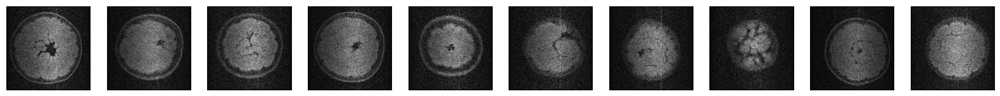

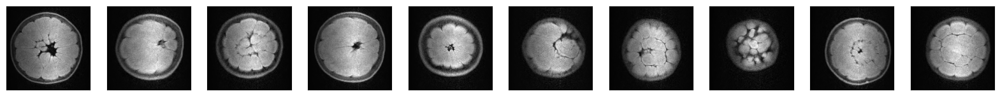

In [183]:
n = 10
plt.figure(figsize=(20, 10))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(x_train_noisy[i].reshape(x_train_noisy.shape[1], x_train_noisy.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 10
plt.figure(figsize=(20, 10))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(x_train[i].reshape(x_train_noisy.shape[1], x_train_noisy.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [184]:
#10% from train Validation
x_train, x_val = train_test_split(x_train,
                                   test_size=0.1,
                                   random_state=SEED)

x_train_noisy, x_val_noisy = train_test_split(x_train_noisy,
                                   test_size=0.1,
                                   random_state=SEED)

print(x_train.shape)
print(x_val.shape)
print(x_train_noisy.shape)
print(x_val_noisy.shape)

(518, 160, 160, 1)
(58, 160, 160, 1)
(518, 160, 160, 1)
(58, 160, 160, 1)


## Train

https://stackoverflow.com/questions/48418907/adapting-the-keras-variational-autoencoder-for-denoising-images

In [10]:
#Necesario, si no da error
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()

In [11]:
import numpy as np
import time
import sys
import os


from scipy.stats import norm

from keras.layers import Input, Dense, Lambda
from keras.models import Model
from keras import backend as K
from tensorflow.python.keras import backend as K
from keras import metrics
from keras.datasets import mnist

from keras.callbacks import ModelCheckpoint

In [12]:
from keras import backend as K


In [13]:
original_dim = 25600
# set the dimensionality of the latent space to a plane for visualization later
latent_dim = 1
epsilon_std = 1.0

In [14]:
#REDNet
encoder_inputs = tensorflow.keras.Input(shape=(160, 160, 1))
y = layers.Conv2D(4, kernel_size=(3,3), padding='same')(encoder_inputs)
y = layers.LeakyReLU()(y)
y = layers.Conv2D(8, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y2 = layers.Conv2D(16, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y2)
y = layers.Conv2D(32, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y3 = layers.Conv2D(64, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y3)
y = layers.Conv2D(128, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y4 = layers.Conv2D(256, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y4)
y = layers.Conv2D(512, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)

#Flattening for the bottleneck
vol = y.shape
x = layers.Flatten()(y)

#latent
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
def sampling(args):
    z_mean, z_log_var = args
    batch = tensorflow.shape(z_mean)[0]
    epsilon = tensorflow.keras.backend.random_normal(shape=(batch, latent_dim), mean=0.,
                              stddev=epsilon_std)
    return z_mean + K.exp(z_log_var / 2) * epsilon

z = Lambda(sampling, output_shape=(latent_dim,))([z_mean, z_log_var])
x = layers.Dense(np.prod(vol[1:]), activation='relu')(z)
y = layers.Reshape((vol[1], vol[2], vol[3]))(x)

y = layers.Conv2DTranspose(512, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y = layers.Conv2DTranspose(256, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y = layers.Add()([y4, y]) #1
y = layers.LeakyReLU()(y)
y = BatchNormalization()(y)
y = layers.Conv2DTranspose(128, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y = layers.Conv2DTranspose(64, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y = layers.Add()([y3, y]) #1
y = layers.LeakyReLU()(y)
y = BatchNormalization()(y)
y = layers.Conv2DTranspose(32, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y = layers.Conv2DTranspose(16, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y = layers.Add()([y2, y])
y = layers.LeakyReLU()(y)
y = BatchNormalization()(y)
y = layers.Conv2DTranspose(8, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y = layers.Conv2DTranspose(4, kernel_size=(3,3), padding='same')(y)
y = layers.LeakyReLU()(y)

y = layers.Conv2DTranspose(1, (3,3), padding='same')(y)
y = layers.LeakyReLU()(y)
y = layers.Add()([encoder_inputs, y]) #1
x_decoded_mean = layers.Activation('sigmoid')(y)

Instructions for updating:
Colocations handled automatically by placer.


In [16]:
vae = Model(encoder_inputs, x_decoded_mean)

In [17]:
#Para guardar las épocas al reentrenar
loss_list = []
val_loss_list = []
epoch_list = []

In [18]:
def vae_loss(x, x_decoded_mean):
    xent_loss = original_dim * metrics.binary_crossentropy(x, x_decoded_mean)
    kl_loss = - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
    return xent_loss + kl_loss

In [19]:
# Loss functtion
def ssim_loss(y_true, y_pred):
    return 1 - tensorflow.reduce_mean(tensorflow.image.ssim(y_true, y_pred, 1.0))

In [20]:
def vae_ssim_loss(x, x_decoded_mean):
    xent_loss = original_dim * ssim_loss(x, x_decoded_mean)
    kl_loss = - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
    return xent_loss + kl_loss

In [21]:
optimizer=tensorflow.keras.optimizers.Adam(learning_rate=0.00001)
#optimizer='Adam'
vae.compile(optimizer=optimizer, loss=vae_ssim_loss)

In [22]:
vae.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 160, 160, 4)  40          ['input_1[0][0]']                
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 160, 160, 4)  0           ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 160, 160, 8)  296         ['leaky_re_lu[0][0]']        

In [ ]:
#Guardar cada 3 épocas los pesos
from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint_callback = ModelCheckpoint(
    filepath='autoencoders_keras_physio_MRI_weights/vae_pruebas/pesos_modelo_{epoch:08d}.h5',
    save_weights_only=True
)

In [ ]:
#Learning rate scheduler
def scheduler(epoch, lr):
    if epoch < 7:
        lr = 0.0001
    else:
        lr=0.00001
    return lr
scheduler_callback = tensorflow.keras.callbacks.LearningRateScheduler(scheduler)

In [ ]:
#Time predict
start_time = datetime.now() 

epocas = 15
batch_size = 1

autoencoder_train = vae.fit(x_train_noisy, x_train,
        shuffle=True,
        epochs=epocas,
        batch_size=batch_size,
        validation_data=(x_val_noisy, x_val),
        callbacks=[checkpoint_callback])
#Time predict
print(" ")
print('Time elapsed (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))

In [ ]:
loss = autoencoder_train.history['loss']
loss_list.extend(loss[:])
val_loss = autoencoder_train.history['val_loss']
val_loss_list.extend(val_loss[:])
epoch_list.append(epocas)
epochs = range(np.sum(epoch_list))

In [ ]:
plt.figure()
plt.rcParams.update({'font.size': 14})
plt.plot(epochs, loss_list, 'bo', color='#006699', label='Training loss')
plt.plot(epochs, val_loss_list, 'b', color='#006699', label='Validation loss')
plt.xlabel('epochs')
plt.ylabel('SSIM loss')
plt.title('Training and validation loss', pad = 20)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
plt.gca().set_facecolor('white')
plt.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlim(5, 15)
plt.ylim(4000, 5500)
plt.show()

In [ ]:
print(optimizer)
print(batch_size)

print(loss_list)
print(val_loss_list)
print(epoch_list)

## Save

In [23]:
#path_load_save='autoencoders_keras_physio_MRI_weights/vae_pruebas/pesos_modelo_00000060.h5'
path_load_save='autoencoders_keras_physio_MRI_weights/mejor_vae/15_epoch_rednet.h5'

In [24]:
#Clear TF memory
#tensorflow.keras.backend.clear_session() #to release all TF memory

In [25]:
autoencoder = tensorflow.keras.Model(encoder_inputs, x_decoded_mean)

In [26]:
autoencoder.load_weights(path_load_save)

## Predict

In [185]:
decoded_imgs = vae.predict(x_test,batch_size=1)

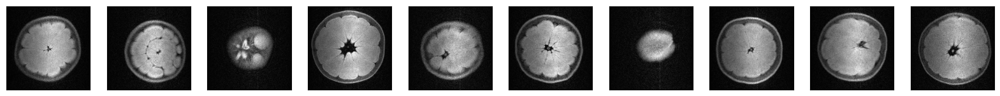

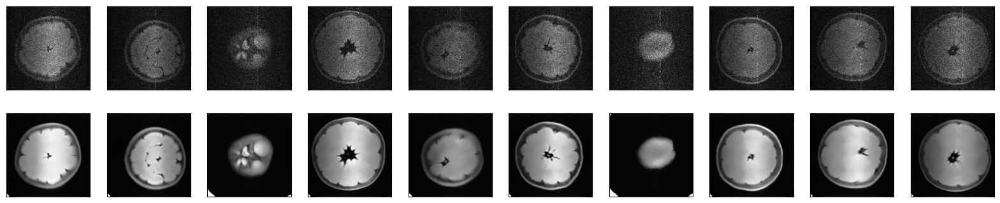

In [186]:
n = 10
plt.figure(figsize=(20, 4))
for i in range(1, n + 1):
    # Display original 
    ax = plt.subplot(2, n, i + n)
    plt.imshow(x_test[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 10
plt.figure(figsize=(20, 4))
for i in range(1, n + 1):
    # Display original noise
    ax = plt.subplot(2, n, i)
    plt.imshow(x_test_noisy[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Display reconstruction
    ax = plt.subplot(2, n, i + n)
    plt.imshow(decoded_imgs[i].reshape(x_test.shape[1], x_test.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [187]:
import utils

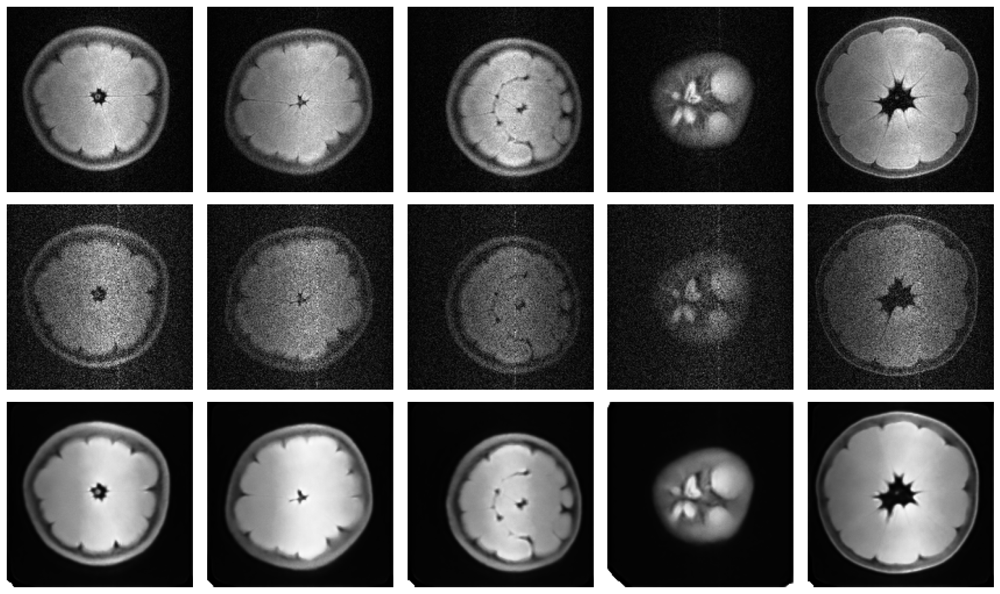

In [188]:
utils.show_image(x_test, x_test_noisy, decoded_imgs)

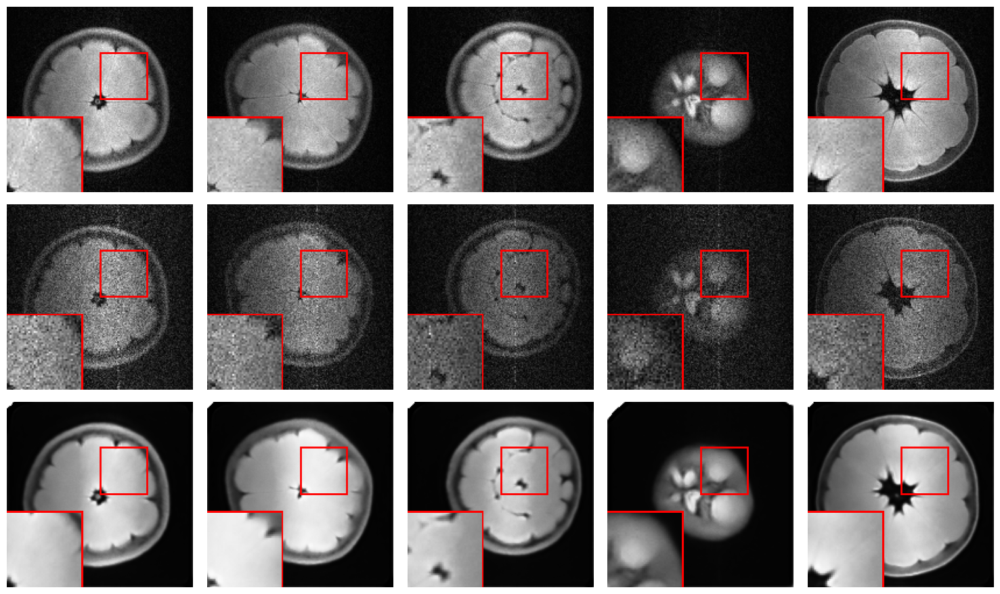

In [189]:
utils.show_windows_image(x_test, x_test_noisy, decoded_imgs)

## Métricas

In [190]:
#PSNR
from skimage.metrics import peak_signal_noise_ratio as psnr
psnr_general=0
psnr_noise_hist=[]
for i in list(range(x_test.shape[0])):
    psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])
    psnr_noise_hist.append(psnr_noise)
    psnr_general=psnr_general+psnr_noise

mean_psnr = psnr_general/x_test.shape[0]

#std PSNR
sum_std = []
for i in list(range(x_test.shape[0])):
    psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])
    psnr_noise_mean = (psnr_noise - mean_psnr)**2
    sum_std.append(psnr_noise_mean)

psnr_std = (np.sum(psnr_noise_mean)/x_test.shape[0])**0.5
print('PSNR: '+ str(mean_psnr) + " +- " + str(psnr_std))


#SSIM
from skimage.metrics import structural_similarity as ssim
ssim_general=0
ssim_noise_hist=[]

#Compute the mean structural similarity index between two images.
for i in list(range(x_test.shape[0])):
    ssim_noise = ssim(x_test[i,:,:,0], decoded_imgs[i,:,:,0],
                  data_range=decoded_imgs[i,:,:,0].max() - decoded_imgs[i,:,:,0].min())
    ssim_noise_hist.append(ssim_noise)
    ssim_general=ssim_general+ssim_noise
    
mean_ssim = ssim_general/x_test.shape[0]

#std SSIM
sum_std = []
for i in list(range(x_test.shape[0])):
    ssim_noise = ssim(x_test[i,:,:,0], decoded_imgs[i,:,:,0],
                  data_range=decoded_imgs[i,:,:,0].max() - decoded_imgs[i,:,:,0].min())
    ssim_noise_mean = (ssim_noise - mean_ssim)**2
    sum_std.append(ssim_noise_mean)
    
ssim_std = (np.sum(ssim_noise_mean)/x_test.shape[0])**0.5
print("SSIM: "+ str(mean_ssim) + " +- " + str(ssim_std))

PSNR: 17.495787630366284 +- 0.08376887697511985
SSIM: 0.7443585640020163 +- 0.0022660820983878742


C:\Users\usuario\AppData\Local\Temp\ipykernel_21100\2183798020.py:6: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])
C:\Users\usuario\AppData\Local\Temp\ipykernel_21100\2183798020.py:15: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noise = psnr(x_test[i,:,:,0], decoded_imgs[i,:,:,0])


In [191]:
x_test.shape

(36, 160, 160, 1)

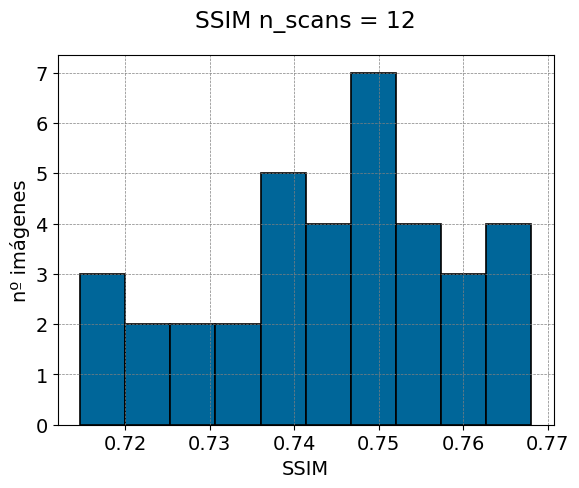

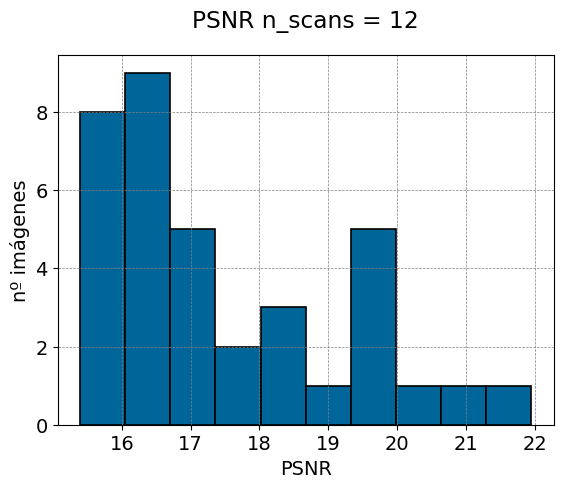

In [192]:
plt.rcParams.update({'font.size': 14})
plt.hist(ssim_noise_hist, color='#006699', edgecolor='black', linewidth=1.2)
plt.xlabel('SSIM')
plt.ylabel('nº imágenes')
plt.title('SSIM n_scans = ' +  str(n_scans), pad = 20)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
plt.gca().set_facecolor('white')
plt.show()

plt.rcParams.update({'font.size': 14})
plt.hist(psnr_noise_hist, color='#006699', edgecolor='black', linewidth=1.2)
plt.xlabel('PSNR')
plt.ylabel('nº imágenes')
plt.title('PSNR n_scans = ' +  str(n_scans), pad = 20)
plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
plt.gca().set_facecolor('white')
plt.show()

In [193]:
hist_sort_values=np.sort(ssim_noise_hist)
hist_sort_index=np.argsort(ssim_noise_hist)

hist_sort_values_psnr=np.sort(psnr_noise_hist)
hist_sort_index_psnr=np.argsort(psnr_noise_hist)

**worst ssim and psnr**

In [194]:
worst_ssim=hist_sort_index[:5]
worst_psnr=hist_sort_index_psnr[:5]

In [195]:
print(hist_sort_values[:5])
print(hist_sort_values_psnr[:5])

[0.7147059  0.71851104 0.71984549 0.7207586  0.72169906]
[15.39581665 15.61045911 15.61702035 15.64050026 15.667777  ]


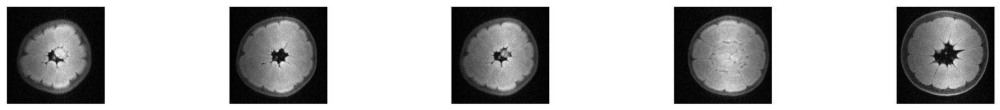

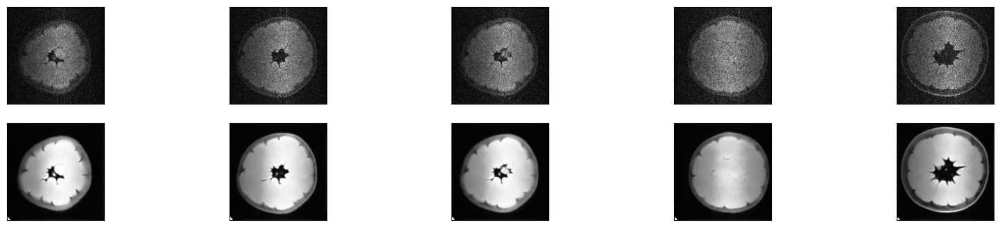

In [196]:
n = 5
plt.figure(figsize=(20, 4))

j=0
for i,j in zip(worst_ssim, range(1, n + 1)):
    # Display original 
    ax = plt.subplot(2, n, j + n)
    plt.imshow(x_test[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 5
plt.figure(figsize=(20, 4))
for i,j in zip(worst_ssim, range(1, n + 1)):
    # Display original noise
    ax = plt.subplot(2, n, j)
    plt.imshow(x_test_noisy[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Display reconstruction
    ax = plt.subplot(2, n, j + n)
    plt.imshow(decoded_imgs[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

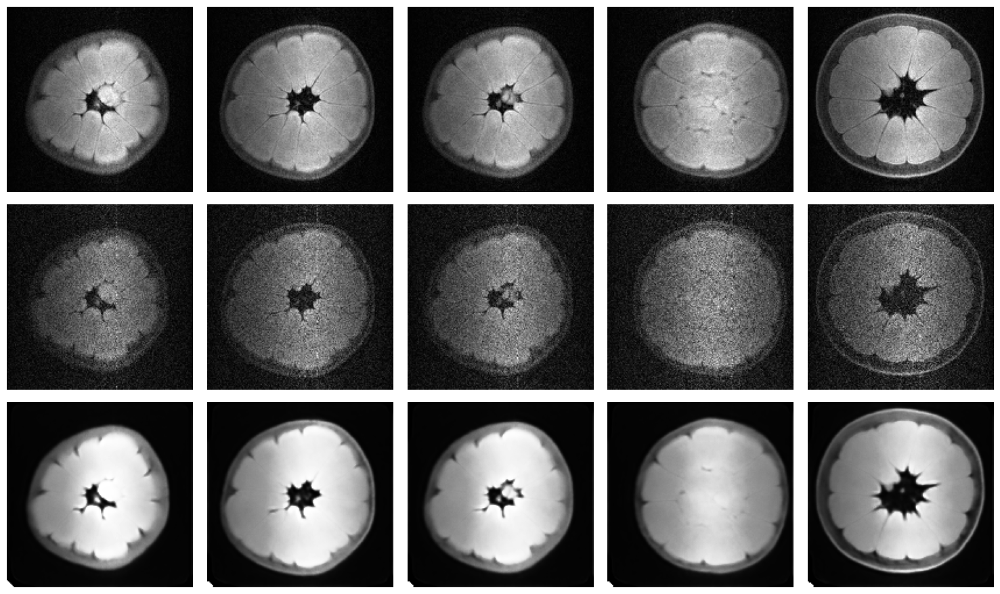

In [197]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_ssim)

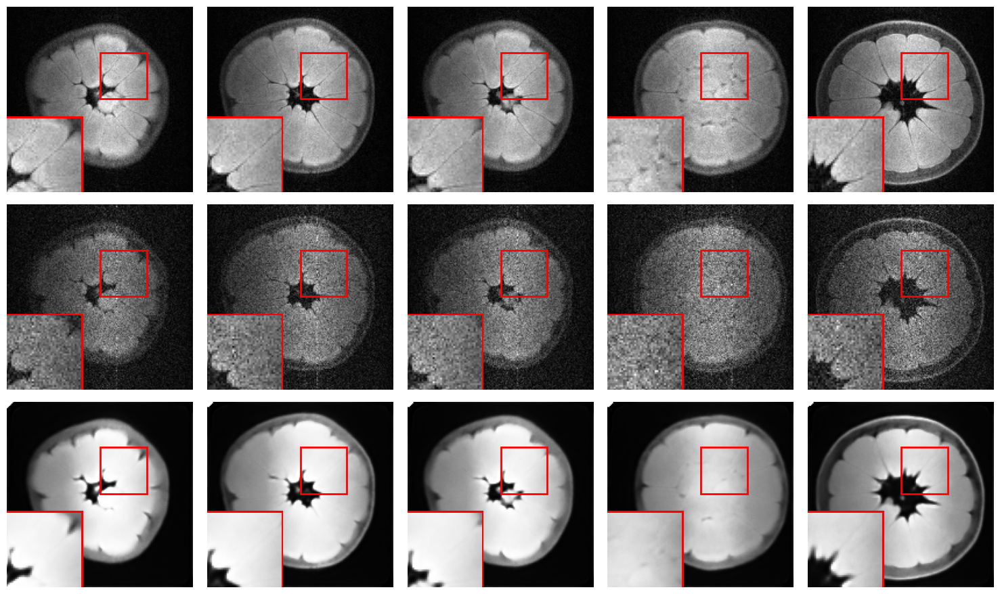

In [198]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_ssim)

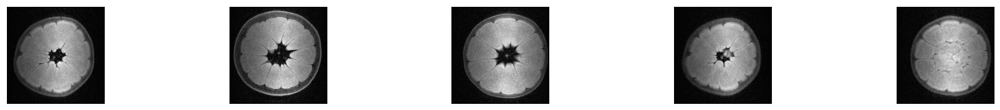

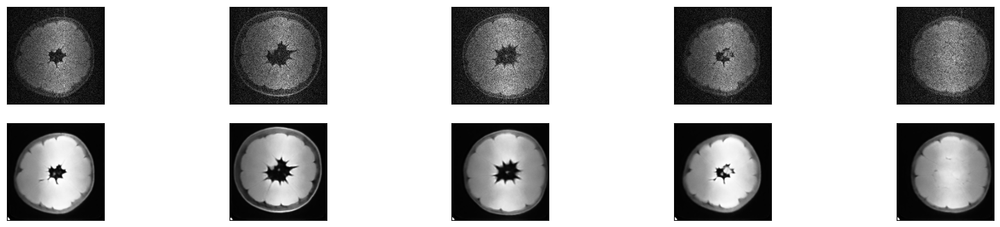

In [199]:
n = 5
plt.figure(figsize=(20, 4))

j=0
for i,j in zip(worst_psnr, range(1, n + 1)):
    # Display original 
    ax = plt.subplot(2, n, j + n)
    plt.imshow(x_test[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 5
plt.figure(figsize=(20, 4))
for i,j in zip(worst_psnr, range(1, n + 1)):
    # Display original noise
    ax = plt.subplot(2, n, j)
    plt.imshow(x_test_noisy[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # Display reconstruction
    ax = plt.subplot(2, n, j + n)
    plt.imshow(decoded_imgs[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

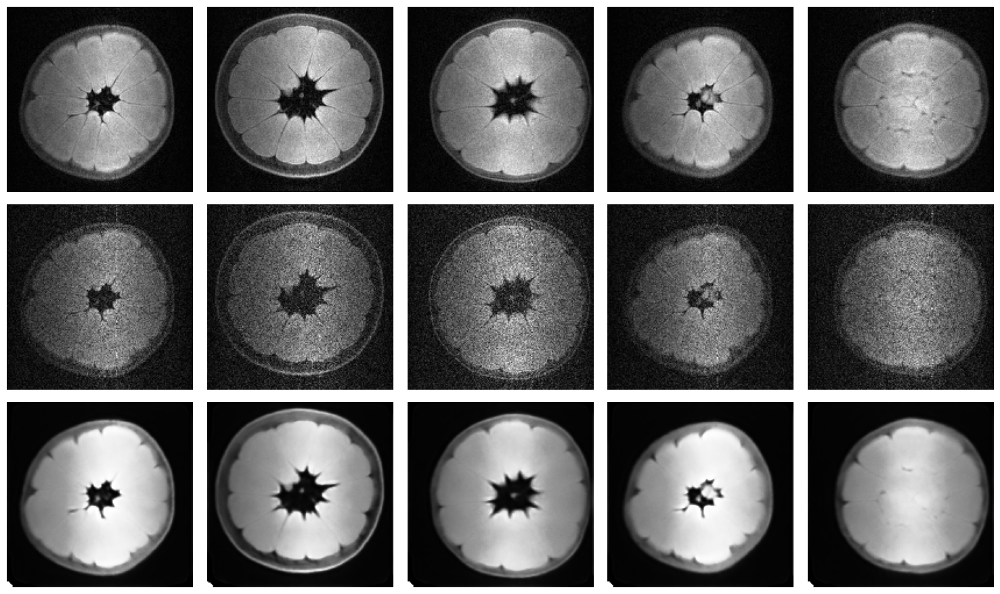

In [200]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_psnr)

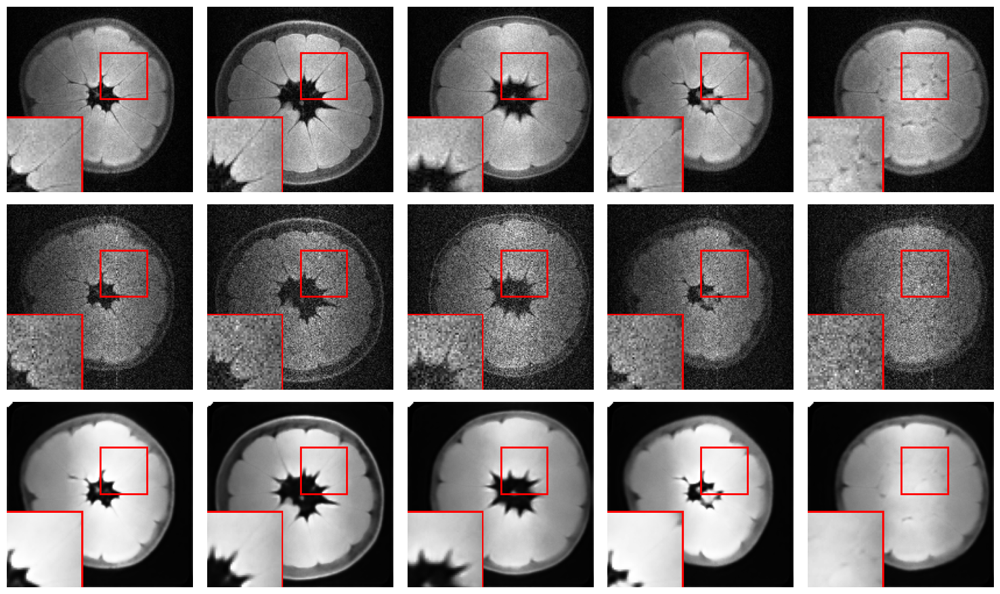

In [201]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, worst_psnr)

**best SSIM**

In [202]:
best_ssim=hist_sort_index[len(hist_sort_index)-5:len(hist_sort_index)]
best_psnr=hist_sort_index_psnr[len(hist_sort_index_psnr)-5:len(hist_sort_index_psnr)]

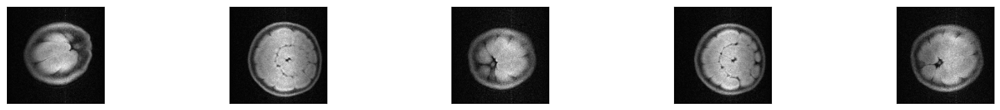

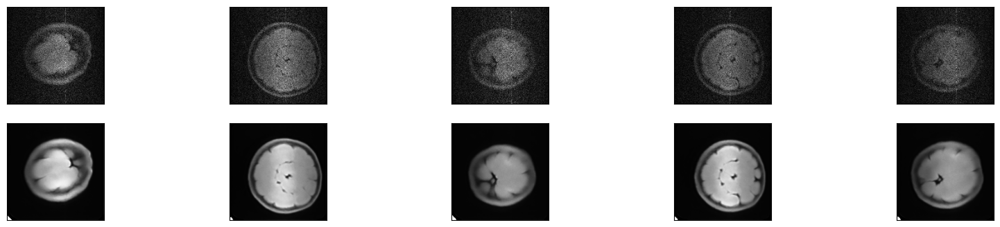

In [203]:
n = 5
plt.figure(figsize=(20, 4))

j=0
for i,j in zip(best_ssim, range(1, n + 1)):
    # Display original 
    ax = plt.subplot(2, n, j + n)
    plt.imshow(x_test[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 5
plt.figure(figsize=(20, 4))
for i,j in zip(best_ssim, range(1, n + 1)):
    # Display original noise
    ax = plt.subplot(2, n, j)
    plt.imshow(x_test_noisy[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    
    
    # Display reconstruction
    ax = plt.subplot(2, n, j + n)
    plt.imshow(decoded_imgs[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

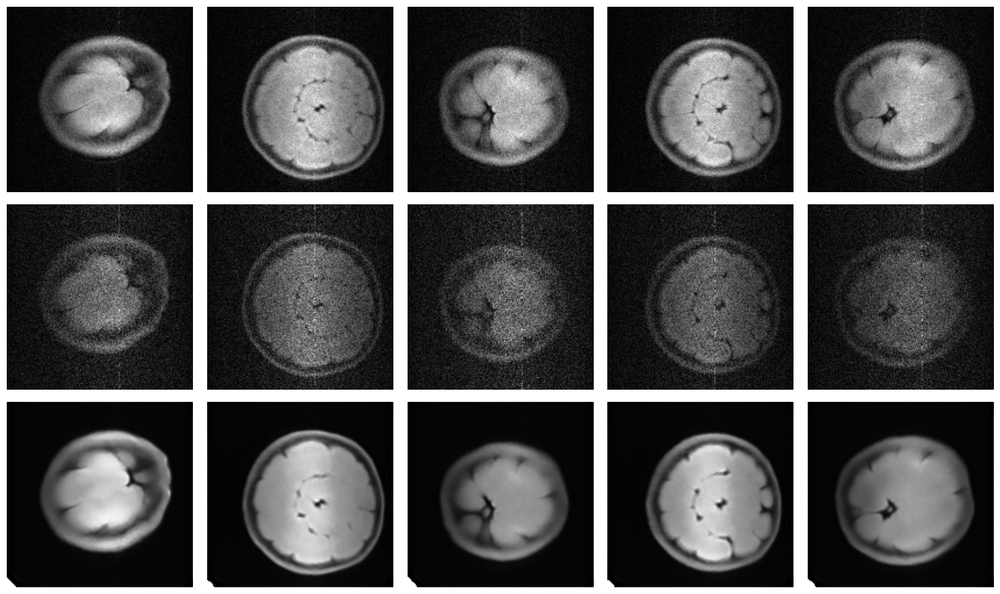

In [204]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_ssim)

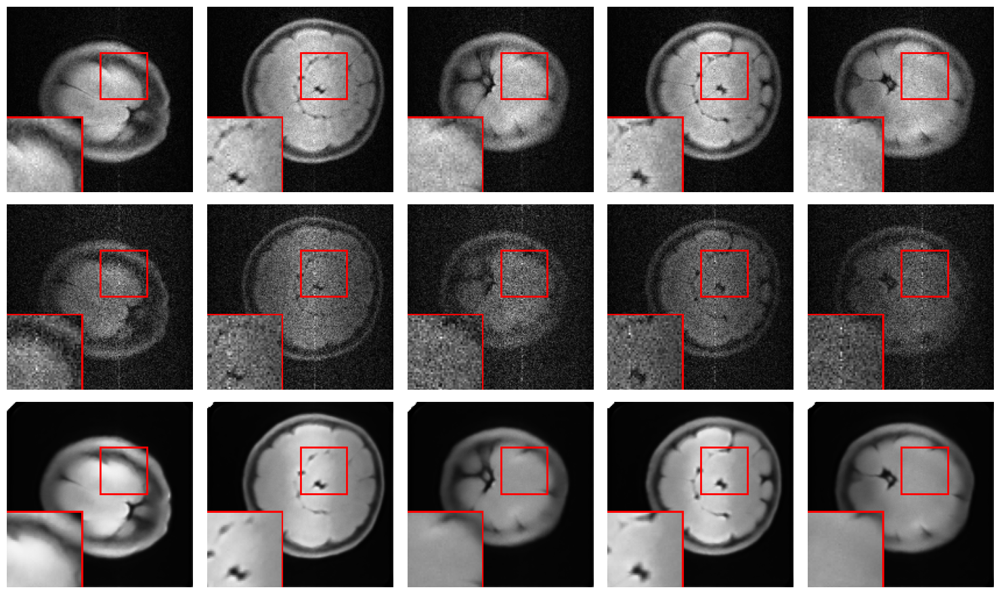

In [205]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_ssim)

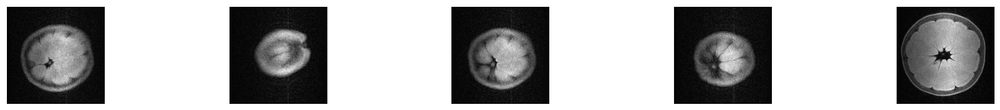

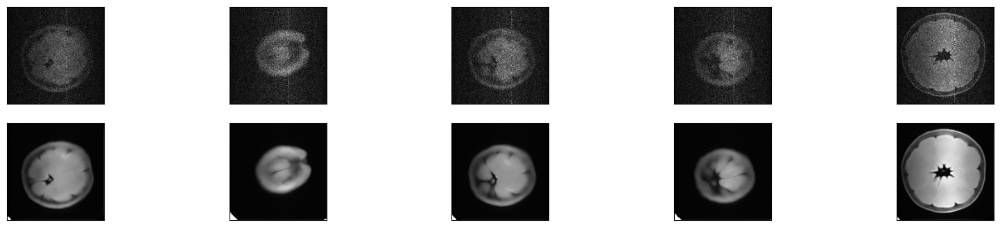

In [206]:
n = 5
plt.figure(figsize=(20, 4))

j=0
for i,j in zip(best_psnr, range(1, n + 1)):
    # Display original 
    ax = plt.subplot(2, n, j + n)
    plt.imshow(x_test[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

n = 5
plt.figure(figsize=(20, 4))
for i,j in zip(best_psnr, range(1, n + 1)):
    # Display original noise
    ax = plt.subplot(2, n, j)
    plt.imshow(x_test_noisy[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    
    
    # Display reconstruction
    ax = plt.subplot(2, n, j + n)
    plt.imshow(decoded_imgs[i].reshape(x_train.shape[1], x_train.shape[1]))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

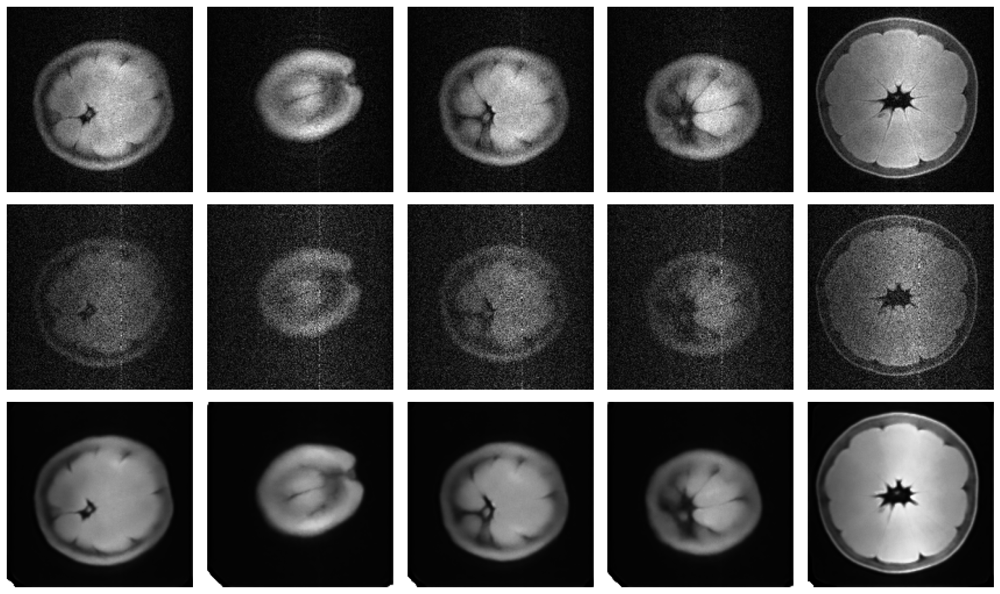

In [207]:
utils.show_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_psnr)

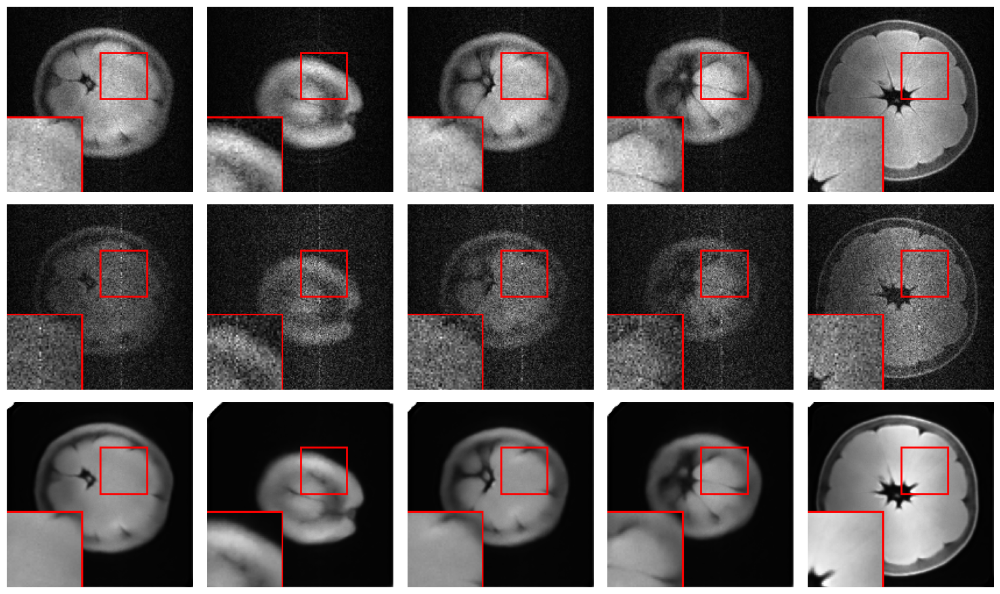

In [208]:
utils.show_windows_image_worstbest(x_test, x_test_noisy, decoded_imgs, best_psnr)